<h1><center>Mental Health Illness from 1990-2016</center></h1>
<h3><center>Vardaan Bhatia, Mridul Gupta, and Prem Patel</center></h3>


The domain of interest of this study is mental health; the focus of this study will be to analyze trends of causes leading to mental health concerns. The problem that will be investigated will be as to what personal and professional factors affect people with mental health concerns based on collection of data from various parts of the world. It will be observed how the employment status and income brackets factors into this situation and how this relates in the corporate work, personal life and the location people are based out of.
Moreover, this study will focus on making comparisons into how living in different countries add to this issue. How the measures taken from the past, which could include family history and treatment options taken by an individual, contribute to this. The study will put emphasis on the changes and trends that can be identified from 1990 to 2016, the range of factors associated with it and how these factors affect an individual’s life by being a reason for various mental disorders to develop. Effectively understanding, acknowledging, and going on a path to alleviate these issues is important for an individual’s wellbeing and improving their overall quality of life. 

In the scope of our study, we are working with five different datasets around the general theme of mental health. First one includes the pervalance of seven different kinds of Disorders among the population from various countries across the globe from the years 1990-2017. In this dataset the disorder among population is brokendown into percentages. The second dataset includes the prevalance of depression across different age groups from several countries. The size of this dataset is very similar to that of the first one and contains information from year 1990-2017. The third dataset includes the prevalance of depression broken down in to males and females across several countries from year 1990-2017. The  source of these  datasets  is  from  Institute  for  Health  Metrics  and  Evaluation  (IHME), which is an independent global health research center at the University of Washington. The fourth dataset has data on depression prevalence across several countries, disaggregated by education level and employment status; it has been gathered from Organisation for Economic Co-operation and Development (OECD). This dataset only contains information from year 2014. All of the above dataset are in .xlsx format. The fifth dataset is a Tech Survey csv file containing responses from over 1200 people. The data includes categorical variables such as (Yes, No, Don't know) regarding their employment, family, and mental health concerns. The source of this dataset is from OSMH (formerly OSMI). Open Sourcing Mental Health is a non-profit, 501(c)(3) corporation dedicated to raising awareness, educating, and providing resources to support mental wellness in the tech and open source communities.

The resource available for download on IHME Websites can be used, shared, modified or built upon by non-commercial users in accordance with the IHME FREE-OF-CHARGE NON-COMMERCIAL USER AGREEMENT


The guiding questions that will be addressed using the above datasets in this investigation are:
1. How does each country rank with its population suffering from a specific mental illness?
2. What kind of relationship patterns do we see between the disorders?   
3. What is the general trend of education level based on the three main educational levels?
4. General insights into how depression percentages compared between people actively looking for jobs vs job searchers?
5. How do the depression levels change over the years across both, gender and age groups?
6. Analyze/derive patterns if any across various continents by gender or age groups.



These questions will be important when researching and analyzing data about mental health. Our insights of these quesiton will provide evidence which can drastically impact public health policies. Furthermore, Corporate companies can also use the analysis to create a better work environment for their employees and improve their employee retention rate. On top of that presenting the insights of our project can assist public health professionals to strategize policies to improve the population's overall mental health. The goal of this study is to create awareness and allow people to realize the importance of their mental well being and to be able to be more productive in their day to day activities.

#### Below is the list of libraries used for data wrangling and data visualization tasks.

In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
from plotly import graph_objs as go
import sys
!{sys.executable} -m pip install --user pycountry_convert
!{sys.executable} -m pip install --user openpyxl
import pycountry_convert as pc

#### To answer the first two guiding questions the data for mental illness and substance use was gathered from the datasets and then plotted in a bar graph using plotly. 

In [2]:
# Importing DataSet "Prevalance by Mental Disorder and Substance" for answering the first two guiding quesitons
df = pd.read_excel("Mental health Depression disorder Data.xlsx","prevalence-by-mental-and-substa")


In [3]:
# Data Wrangaling : Renaming Columns 

df.rename(columns = {'Entity':'Country',
                    'Schizophrenia (%)': 'Schizophrenia',
                    'Bipolar disorder (%)': 'Bipolar Disorder',
                    'Eating disorders (%)': 'Eating Disorder',
                    'Anxiety disorders (%)': 'Anxiety Disorder',
                    'Drug use disorders (%)': 'Drug use Disorder',
                    'Alcohol use disorders (%)': 'Alcohol Disorder',
                    'Depression (%)': 'Depression'}, inplace = True)
df.dtypes

Country               object
Code                  object
Year                   int64
Schizophrenia        float64
Bipolar Disorder     float64
Eating Disorder      float64
Anxiety Disorder     float64
Drug use Disorder    float64
Depression           float64
Alcohol Disorder     float64
dtype: object

In [4]:
#Data Wrangaling: Convert Year from float to Integer
df["Year"]= df['Year'].astype('int')


In [5]:
#Convert from Country Name to Continents
continent = []

for i in df['Country']:
    try:
        country_code = pc.country_name_to_country_alpha2(i, cn_name_format="default")
        
    except:
        country_code = 'Unknown'
    
    if country_code != 'Unknown':
        continent_name = pc.country_alpha2_to_continent_code(country_code)
        
        continent.append(continent_name)
    else:
        continent.append('none')

#Add the continenets array as data frame 

df['Continent'] = continent
display(df)

,Country,Code,Year,Schizophrenia,Bipolar Disorder,Eating Disorder,Anxiety Disorder,Drug use Disorder,Depression,Alcohol Disorder,Continent
0,Afghanistan,AFG,1990,0.160560,0.697779,0.101855,4.828830,1.677082,4.071831,0.672404,AS
1,Afghanistan,AFG,1991,0.160312,0.697961,0.099313,4.829740,1.684746,4.079531,0.671768,AS
2,Afghanistan,AFG,1992,0.160135,0.698107,0.096692,4.831108,1.694334,4.088358,0.670644,AS
3,Afghanistan,AFG,1993,0.160037,0.698257,0.094336,4.830864,1.705320,4.096190,0.669738,AS
4,Afghanistan,AFG,1994,0.160022,0.698469,0.092439,4.829423,1.716069,4.099582,0.669260,AS
...,...,...,...,...,...,...,...,...,...,...,...
6463,Zimbabwe,ZWE,2013,0.155670,0.607993,0.117248,3.090168,0.766280,3.128192,1.515641,AF
6464,Zimbabwe,ZWE,2014,0.155993,0.608610,0.118073,3.093964,0.768914,3.140290,1.515470,AF
6465,Zimbabwe,ZWE,2015,0.156465,0.609363,0.119470,3.098687,0.771802,3.155710,1.514751,AF
6466,Zimbabwe,ZWE,2016,0.157111,0.610234,0.121456,3.104294,0.772275,3.174134,1.513269,AF


,Year,Schizophrenia,Bipolar Disorder,Eating Disorder,Anxiety Disorder,Depression,Alcohol Disorder,Drug use Disorder
0,1990,0.209548,0.715392,0.221774,3.957269,3.506288,1.546533,0.808283
1,1991,0.209586,0.715740,0.222076,3.960009,3.510948,1.553500,0.813466
2,1992,0.209634,0.716091,0.222481,3.962778,3.515033,1.559927,0.818692
3,1993,0.209690,0.716430,0.223033,3.965405,3.518531,1.565611,0.823780
4,1994,0.209751,0.716755,0.223710,3.967976,3.521437,1.570127,0.828389
5,1995,0.209810,0.717037,0.224514,3.970051,3.523328,1.573532,0.832391
6,1996,0.209877,0.717293,0.225581,3.972869,3.524659,1.576549,0.837124
7,1997,0.209966,0.717564,0.226980,3.977437,3.525602,1.579598,0.843217
8,1998,0.210075,0.717843,0.228581,3.982739,3.525968,1.582334,0.849664
9,1999,0.210200,0.718117,0.230264,3.987662,3.525664,1.584450,0.855211


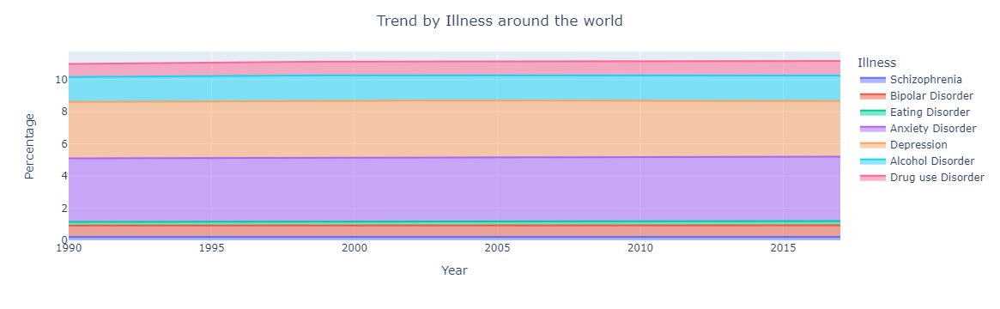

In [6]:
#Grouped by country and took mean of all disorders between 1990-2017
dfyear = df.groupby(["Year"],as_index=False)[['Schizophrenia','Bipolar Disorder','Eating Disorder','Anxiety Disorder','Depression','Alcohol Disorder','Drug use Disorder']].mean()
display(dfyear)

fig = px.area(dfyear, x="Year", y=['Schizophrenia','Bipolar Disorder','Eating Disorder','Anxiety Disorder','Depression','Alcohol Disorder','Drug use Disorder'])
fig.update_layout(
    title_text="Trend by Illness around the world",
    title_x=0.5,
    legend_title_text="Illness",
    yaxis_title="Percentage"
    
    
)
fig.show()

Analyzing this area graph we can infer the following:

From the percentage of people suffering from various mental Illness, Anxiety Disorder and Depression are the leading most from all Illness plotted on this graph. We can conclude this because the 'purple' and 'yellow' section take up most of the space of the area under our graph. 

,Country,Continent,Year,Schizophrenia,Bipolar Disorder,Eating Disorder,Anxiety Disorder,Depression,Alcohol Disorder,Drug use Disorder
0,Afghanistan,AS,1990,0.160560,0.697779,0.101855,4.828830,4.071831,0.672404,1.677082
1,Afghanistan,AS,1991,0.160312,0.697961,0.099313,4.829740,4.079531,0.671768,1.684746
2,Afghanistan,AS,1992,0.160135,0.698107,0.096692,4.831108,4.088358,0.670644,1.694334
3,Afghanistan,AS,1993,0.160037,0.698257,0.094336,4.830864,4.096190,0.669738,1.705320
4,Afghanistan,AS,1994,0.160022,0.698469,0.092439,4.829423,4.099582,0.669260,1.716069
...,...,...,...,...,...,...,...,...,...,...
5343,Zimbabwe,AF,2013,0.155670,0.607993,0.117248,3.090168,3.128192,1.515641,0.766280
5344,Zimbabwe,AF,2014,0.155993,0.608610,0.118073,3.093964,3.140290,1.515470,0.768914
5345,Zimbabwe,AF,2015,0.156465,0.609363,0.119470,3.098687,3.155710,1.514751,0.771802
5346,Zimbabwe,AF,2016,0.157111,0.610234,0.121456,3.104294,3.174134,1.513269,0.772275


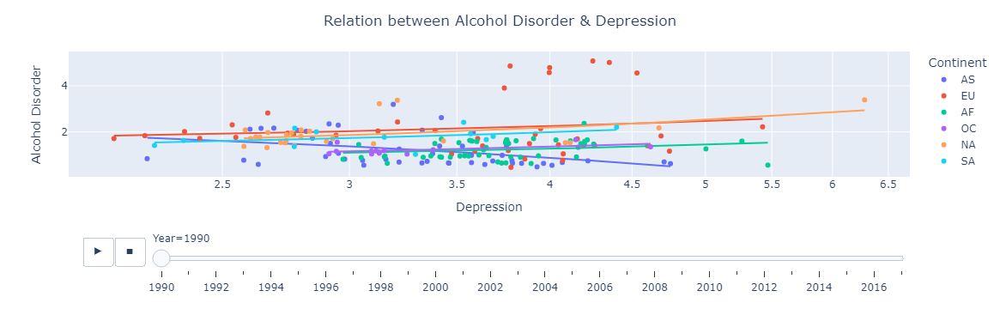

In [7]:
# Removed Rows Containing "none" values ; 
# This removes the rows containing sub-regions listed under country columns so we can focus on individul countries
test = df[df["Continent"].str.contains("none") == False]

#Grouped by country and took mean of all disorders between 1990-2016
test = test.groupby(["Country","Continent","Year"],as_index=False)[['Schizophrenia','Bipolar Disorder','Eating Disorder','Anxiety Disorder','Depression','Alcohol Disorder','Drug use Disorder']].mean()
display(test)


fig = px.scatter(test, x="Depression", y="Alcohol Disorder", color="Continent", trendline="ols",animation_frame = 'Year',
           hover_name="Country", log_x=True)
fig.update_layout(
    title_text="Relation between Alcohol Disorder & Depression",
    title_x=0.5,
)

fig.show()

Analyzing this Scatter Plot we can infer the following:

On this graph we are comparing Alcohol Disorder and Depression across all the countries between 1990-2016 and see how they relate to one another. The graph is interactive and we can turn off-on the legends to see trends in one or multiple continents.

Looking at the following continents: Europe, Africa, North America, South America, and Oceanic:
We can see a weak positive correlation between depression and alcohol disorders. As the country's depression level goes up the alcohol percentage is also slightly increasing. 

For Asian countries:
We can see a weak negative correlation between depression and alcohol disorders. As the country's depression level goes up the alcohol percentage is also slightly decreasing. This insight is might be misleading since it is very differs slightly from the rest of the continent, this might be due to missing data from countries in Asia or inconsistencies in data collection. 

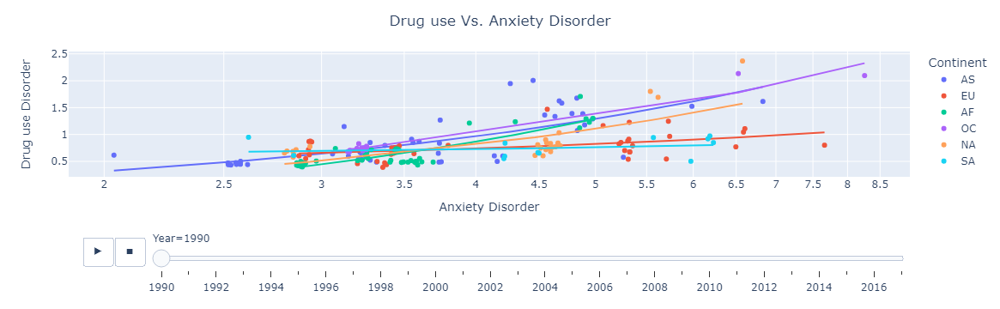

In [8]:
#Scatter Graph
fig = px.scatter(test, x="Anxiety Disorder", y="Drug use Disorder", color="Continent", trendline="ols", animation_frame = 'Year',
           hover_name="Country", log_x=True)
fig.update_layout(
    title_text="Drug use Vs. Anxiety Disorder",
    title_x=0.5,
)

Analyzing this Scatter Plot we can infer the following:

On this graph we are comparing Druguse Disorder and Depression across all the countries (grouped by continents) between 1990-2016 and see how they relate to one another. The graph is interactive and we can turn off-on the legends to see trends in one or multiple continents.

Looking at trends for all the continents:
When clicking the play button on the timeline, we can see a strong positive correlation between Drug use and Anxiety disorders. As the country's Drug use goes up , prevalance of Anxiety Disorder is also increasing. 

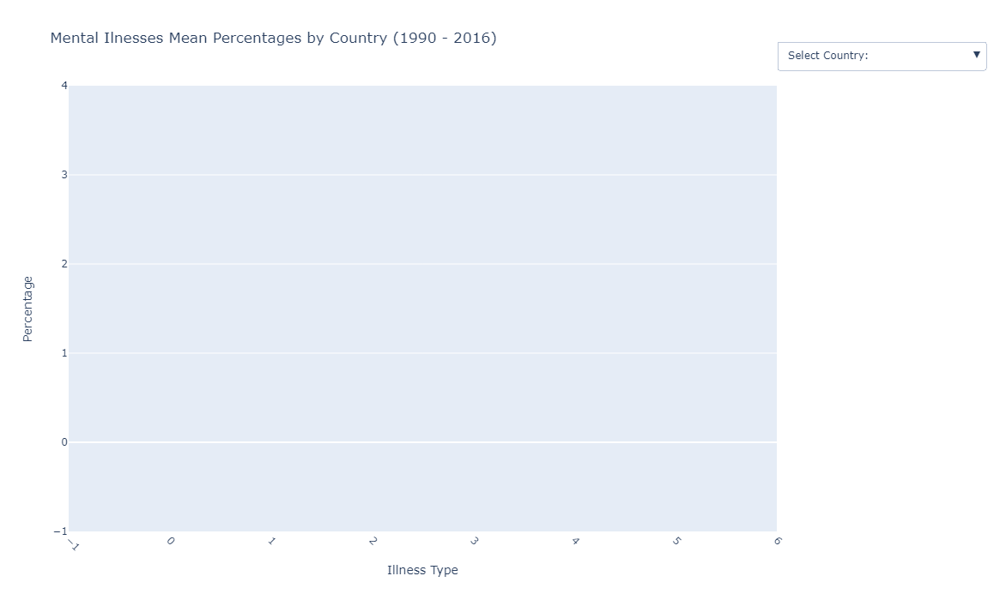

In [9]:
# Bar Graph by Country

#calculating the mean percentages of each ilness by country
dfcountry = df.groupby(["Country","Continent","Code"],as_index=False)[['Schizophrenia','Bipolar Disorder','Eating Disorder','Anxiety Disorder','Depression']].mean()

country=dfcountry['Country'].to_numpy()
x=np.array(['Schizophrenia','Bipolar Disorder','Eating Disorder','Anxiety Disorder',
            'Depression'])
fig = go.Figure()

#These will add buttons to the graph
buttons = [{"label": "Select Country: ", "method": "update", "args": [{'visible': [False for tm in country]}]}]


for ct in country:   
    countryData=df.loc[df['Country']==ct]
    y=countryData[['Schizophrenia','Bipolar Disorder','Eating Disorder','Anxiety Disorder','Depression']].values
    trace = go.Bar(x=x, y=y[0], name=ct, visible=False, hoverinfo="text",hovertext=y[0],
                   marker=dict(color = [12,24,36,48,60,72,84,96,108,120,132,144],
                   colorscale='viridis')
                  )
    button = {"label": ct, 'method': 'update',
            "args": [{'visible': [True if ct == ctx else False for ctx in country]}]}
    fig.add_trace(trace)
    buttons.append(button)

fig.update_layout(
    {
        "updatemenus":[
        go.layout.Updatemenu(buttons=buttons, direction="down", pad={"r": 5, "t": 0}, showactive=True,
                             xanchor="right", x=1.3, yanchor="top", y=1.10)],
        'title_text': 'Mental Ilnesses Mean Percentages by Country (1990 - 2016)',
        'xaxis': dict(title='Illness Type', tickangle=45),
        'yaxis_title_text': 'Percentage',
        "width": 1000, "height": 700,
        "autosize": True
        
    }
)
fig.show()

This is an interactive bar chart :

This graph shows the rankings of each of the mental disorder. This graph also has a button from which we can select a specific country to look at their mean percentages of each Illness. We can hover over to a bar see those specific percentages for that Illness.

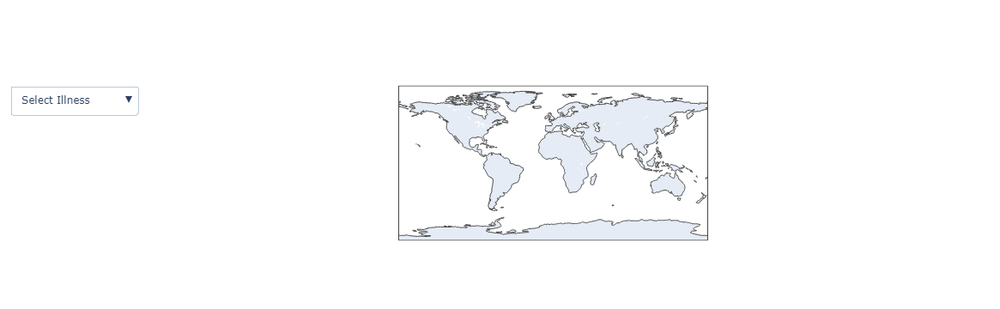

In [10]:
#Interactive button creation code
diseases  = dfcountry.loc[:,'Schizophrenia':'Depression']

fig = go.Figure()

for column in diseases:
    fig.add_trace(
    go.Choropleth(locations = dfcountry['Code'],
    z = dfcountry[column],
    text = dfcountry['Country'],
    reversescale = True,
    marker_line_color='black',
    marker_line_width=.5,
    colorbar_tickprefix="%",
    colorbar_title ='Percentage',
    visible=False,
        )
    )
    
fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        buttons=list(
            [
            dict(label = 'Select Illness',
                  method = 'update',
                  args = [{'visible': [False, False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Select Option From Dropdown',
                           'showlegend':True,
                          }],   
                ),
             dict(label = 'Schizophrenia',
                  method = 'update',
                  args = [{'visible': [True, False, False, False,False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Schizophrenia',
                           'showlegend':True}]),
             dict(label = 'Bipolar Disorder',
                  method = 'update',
                  args = [{'visible': [False, True, False, False,False]},
                          {'title': 'Bipolar Disorder',
                           'showlegend':True}]),
             dict(label = 'Eating Disorder',
                  method = 'update',
                  args = [{'visible': [False, False, True, False,False]},
                          {'title': 'Eating Disorder',
                           'showlegend':True}]),
             dict(label = 'Anxiety Disorders',
                  method = 'update',
                  args = [{'visible': [False, False, False, True,False]},
                          {'title': 'Anxiety Disorders',
                           'showlegend':True}]),
                dict(label = 'Depression',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,True]},
                          {'title': 'Depression',
                           'showlegend':True}])
            ])
        )
    ])
fig.show()

Analyzing this Choropleth graph above we can infer the following:

From this geographic graph we can clearly see the percentages of Illness each country is suffering from. Looking at the color scale of different illness around the world gives a good visulization of the intensites. Also, we can interact with the drop down widget to select a specific illness and look at their percentages and intensities around the world.

Depression and Anxiety Disorder are the leading most Illness since their scale range is much higher that others

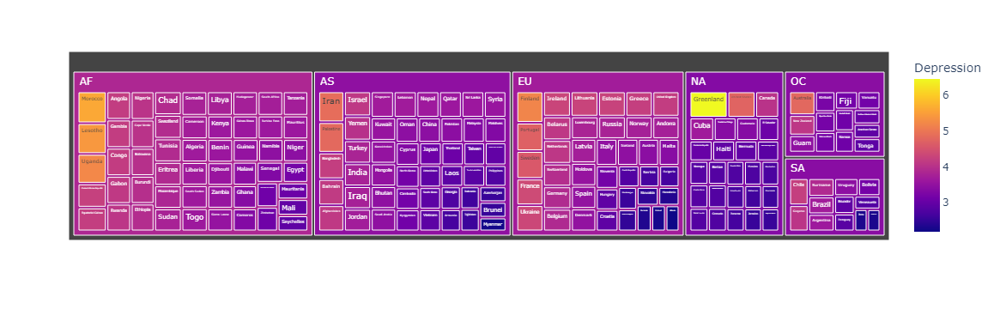

In [11]:
#Tree Map Graph 1
country_continents = dfcountry[dfcountry["Continent"].str.contains("none") == False]

fig = px.treemap(country_continents, path=['Continent','Country'], values='Depression',
                  color='Depression')
fig.show()

Analyzing this TreeMap above we can infer the following:

For this tree map our area of interest was Depresssion. And from this tree map we can clearly see that the Top 3 Continents that rank the Highesht in Eating Disorder are 
1. Africa
2. Asia
3. Europe
Additionally, we can click on the Continent to view the countries in it. By hovering over each Continent we can see the sum of percentages of the specific illness. And we can check the intensities by looking at the color scale 

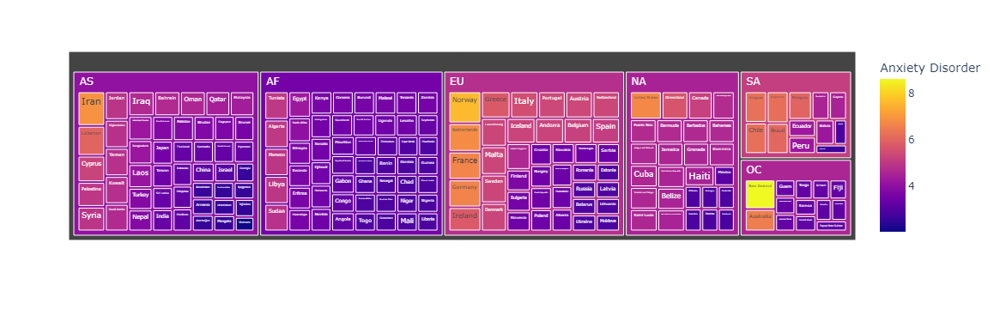

In [12]:
#Tree Map Graph 2
country_continents = dfcountry[dfcountry["Continent"].str.contains("none") == False]

fig = px.treemap(country_continents, path=['Continent','Country'], values='Anxiety Disorder',
                  color='Anxiety Disorder')
fig.show()

Analyzing this TreeMap above we can infer the following:

For this tree map our area of interest was Anxiety Disorder. And from this tree map we can clearly see that the Top 3 Continents that rank the Highesht in Anxiety Disorder are 
1. Asia
2. Africa
3. Europe
Additionally, we can click on the Continent to view the countries in it. By hovering over each Continent we can see the sum of percentages of the specific illness. And we can check the intensities by looking at the color scale 

#### To answer the third guiding question the data for depression by Education Level was gathered from the datasets and then plotted in using plotly. 

# How your guiding questions have evolved since the project proposal.

### Question: Does the education level influence one’s likelihood to experience depression symptoms?

### Evolution: 
 - What is the general trend of education level based on the three main educational levels?
 - General insights into how depression percentages compared between people actively looking for jobs vs job searchers?


In [13]:
#Allows modification for copy of dataframes
pd.set_option('mode.chained_assignment', None)

# Importing DataSet "depression by education level" for answering the first two guiding quesitons

df=pd.read_excel("Mental health Depression disorder Data.xlsx","depression-by-level-of-educatio")
df.head(5)

,Entity,Code,Year,All levels (active) (%),All levels (employed) (%),All levels (total) (%),Below upper secondary (active) (%),Below upper secondary (employed) (%),Below upper secondary (total) (%),Tertiary (active) (%),Tertiary (employed) (%),Tertiary (total) (%),Upper secondary & post-secondary non-tertiary (active) (%),Upper secondary & post-secondary non-tertiary (employed) (%),Upper secondary & post-secondary non-tertiary (total) (%)
0,Austria,AUT,2014,6.5,4.7,7.7,15.5,9.0,15.2,4.3,3.5,5.5,5.5,4.2,6.7
1,Belgium,BEL,2014,5.0,4.1,7.1,7.1,4.8,11.6,3.7,3.3,4.2,5.7,5.0,7.5
2,Czech Republic,CZE,2014,3.0,2.6,4.0,2.1,2.5,6.0,1.7,1.7,2.0,3.5,3.0,4.4
3,Denmark,DNK,2014,6.7,5.7,8.3,10.4,6.5,15.5,5.7,4.7,6.7,7.4,6.9,8.8
4,Estonia,EST,2014,3.8,3.8,5.1,4.7,4.7,6.4,3.6,3.6,4.3,3.7,3.8,5.2


In [14]:
df.tail(5)

,Entity,Code,Year,All levels (active) (%),All levels (employed) (%),All levels (total) (%),Below upper secondary (active) (%),Below upper secondary (employed) (%),Below upper secondary (total) (%),Tertiary (active) (%),Tertiary (employed) (%),Tertiary (total) (%),Upper secondary & post-secondary non-tertiary (active) (%),Upper secondary & post-secondary non-tertiary (employed) (%),Upper secondary & post-secondary non-tertiary (total) (%)
21,Slovenia,SVN,2014,7.6,6.0,8.4,12.3,10.2,12.6,6.2,5.8,6.6,7.1,5.4,7.7
22,Spain,ESP,2014,5.5,4.1,7.1,7.5,5.2,9.7,3.3,2.7,3.5,5.8,5.1,7.1
23,Sweden,SWE,2014,8.4,8.0,9.9,8.8,8.2,11.4,7.9,7.8,9.0,9.2,8.7,10.6
24,Turkey,TUR,2014,10.2,9.6,12.5,10.5,10.0,13.3,9.1,8.2,9.5,12.9,12.5,12.5
25,United Kingdom,GBR,2014,7.4,6.3,9.9,11.0,8.1,15.2,5.7,5.3,7.1,8.3,7.1,10.7


In [15]:
df.dtypes

Entity                                                           object
Code                                                             object
Year                                                              int64
All levels (active) (%)                                         float64
All levels (employed) (%)                                       float64
All levels (total) (%)                                          float64
Below upper secondary (active) (%)                              float64
Below upper secondary (employed) (%)                            float64
Below upper secondary (total) (%)                               float64
Tertiary (active) (%)                                           float64
Tertiary (employed) (%)                                         float64
Tertiary (total) (%)                                            float64
Upper secondary & post-secondary non-tertiary (active) (%)      float64
Upper secondary & post-secondary non-tertiary (employed) (%)    

In [16]:
#Renaming the column names to be more redable and easy to work with as a variable
df.rename(
    columns=({ 'Entity': 'Country', 'All levels (active) (%)': 'All Active Job Searchers','All levels (employed) (%)': 'All Employed',
              'All levels (total) (%)':'All Levels'}), 
    inplace=True,
)
df=df[['Country','All Active Job Searchers','All Employed','All Levels','Below upper secondary (active) (%)',
     'Below upper secondary (employed) (%)','Below upper secondary (total) (%)','Tertiary (active) (%)','Tertiary (employed) (%)',
      'Tertiary (total) (%)','Upper secondary & post-secondary non-tertiary (active) (%)','Upper secondary & post-secondary non-tertiary (employed) (%)',
      'Upper secondary & post-secondary non-tertiary (total) (%)'
     ]]

In [17]:
df.head(5)

,Country,All Active Job Searchers,All Employed,All Levels,Below upper secondary (active) (%),Below upper secondary (employed) (%),Below upper secondary (total) (%),Tertiary (active) (%),Tertiary (employed) (%),Tertiary (total) (%),Upper secondary & post-secondary non-tertiary (active) (%),Upper secondary & post-secondary non-tertiary (employed) (%),Upper secondary & post-secondary non-tertiary (total) (%)
0,Austria,6.5,4.7,7.7,15.5,9.0,15.2,4.3,3.5,5.5,5.5,4.2,6.7
1,Belgium,5.0,4.1,7.1,7.1,4.8,11.6,3.7,3.3,4.2,5.7,5.0,7.5
2,Czech Republic,3.0,2.6,4.0,2.1,2.5,6.0,1.7,1.7,2.0,3.5,3.0,4.4
3,Denmark,6.7,5.7,8.3,10.4,6.5,15.5,5.7,4.7,6.7,7.4,6.9,8.8
4,Estonia,3.8,3.8,5.1,4.7,4.7,6.4,3.6,3.6,4.3,3.7,3.8,5.2


In [18]:
#Sorting Graph based on Depression Percentage
sorted_df = df.sort_values(by='All Levels', ascending=False)

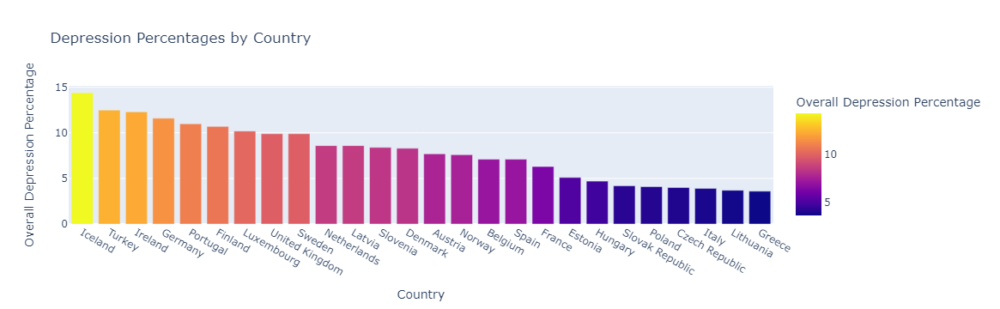

In [19]:
#Bar Graph
fig = px.bar(sorted_df,x='Country', y='All Levels', color='All Levels', title="Depression Percentages by Country",
             labels={'All Levels':'Overall Depression Percentage'})
fig.show()

Analyzing this Bar Graph above we can infer the following:

Since this dataset focuses on data only from the year 2014 and the European sub region, we have decided to use a bar chart to show the percentages of depression ( Across All Educational Levels) in each country from highest to lowest. 

According to Results of the Gallup-Healthways Global Well-Being Index of 2014, Austria Ranked number 4 in being the happiest country that year. Happiness was measured using 5 key elements: purpose well-being, financial well-being, social well-being, community well-being and physical well-being. We can see in our bar chart that from all the European countries, Austria falls towards the lower end of depression levels which suggest overall postivie mental health in the country of Austria

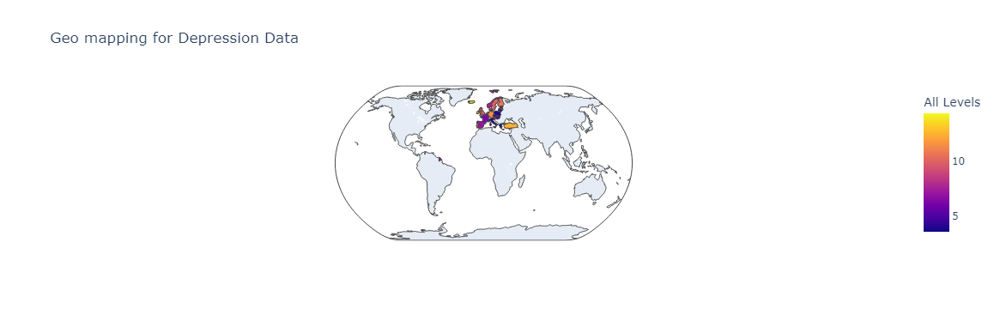

In [20]:
#Chloropleth Graph
geo=px.choropleth(df,locations='Country',locationmode='country names',
                  color='All Levels',hover_name='Country',projection='natural earth',
                 title='Geo mapping for Depression Data')
geo.show()

Above is a Geographic vizualiztion of all the european countries included in the dataset and their respective Levels of Depression is shown in percentages in the color scale. 

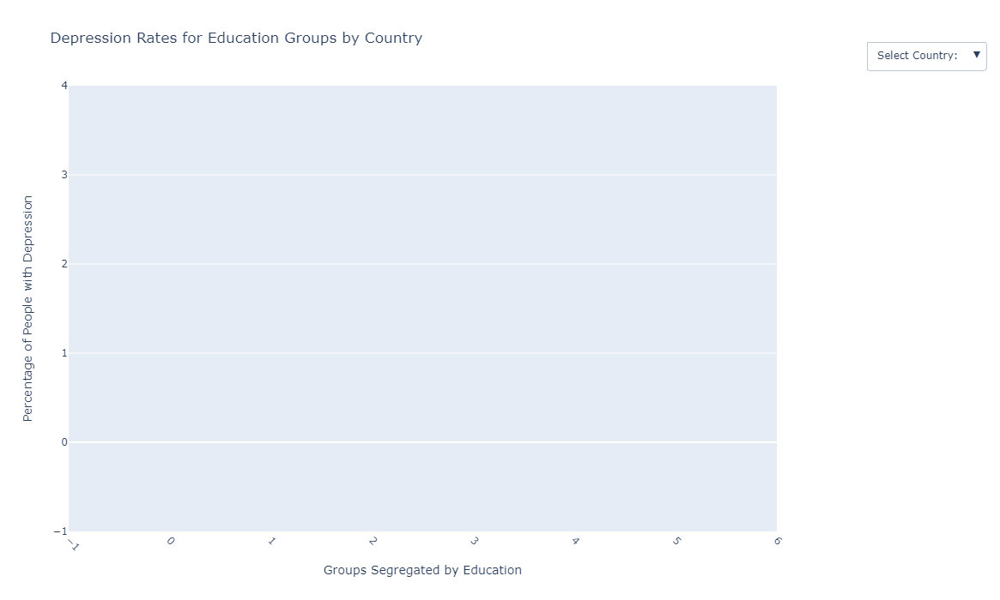

In [21]:
#Interactive button creation code
country=df['Country'].to_numpy()

x=np.array(['All Levels','All Active Job Searchers', 'All Employed', 
            'Below upper secondary (active) (%)', 'Below upper secondary (employed) (%)', 
            'Below upper secondary (total) (%)', 'Tertiary (active) (%)', 'Tertiary (employed) (%)', 
            'Tertiary (total) (%)', 'Upper secondary & post-secondary non-tertiary (active) (%)', 
            'Upper secondary & post-secondary non-tertiary (employed) (%)', 
            'Upper secondary & post-secondary non-tertiary (total) (%)'])
fig = go.Figure()
buttons = [{"label": "Select Country: ", "method": "update", "args": [{'visible': [False for tm in country]}]}]

for ct in country:   
    countryData=df.loc[df['Country']==ct]
    y=countryData[['All Levels','All Active Job Searchers', 'All Employed', 'Below upper secondary (active) (%)', 
               'Below upper secondary (employed) (%)', 'Below upper secondary (total) (%)', 'Tertiary (active) (%)', 
               'Tertiary (employed) (%)', 'Tertiary (total) (%)', 'Upper secondary & post-secondary non-tertiary (active) (%)', 
               'Upper secondary & post-secondary non-tertiary (employed) (%)', 'Upper secondary & post-secondary non-tertiary (total) (%)']].values
    trace = go.Bar(x=x, y=y[0], name=ct, visible=False, hoverinfo="text",hovertext=y[0],
                   marker=dict(color = [12,24,36,48,60,72,84,96,108,120,132,144],
                   colorscale='viridis'))
    button = {"label": ct, 'method': 'update',
            "args": [{'visible': [True if ct == ctx else False for ctx in country]}]}
    fig.add_trace(trace)
    buttons.append(button)

fig.update_layout(
    {
        "updatemenus":[
        go.layout.Updatemenu(buttons=buttons, direction="down", pad={"r": 5, "t": 0}, showactive=True,
                             xanchor="right", x=1.3, yanchor="top", y=1.10)],
        'title_text': 'Depression Rates for Education Groups by Country',
        'xaxis': dict(title='Groups Segregated by Education', tickangle=45),
        'yaxis_title_text': 'Percentage of People with Depression',
        "width": 1000, "height": 700,
        "autosize": True
    }
)
fig.show()

Analyzing this Bar Graph above we can infer the following:

This bargraph analyzes the levels of depression across different educational levels. One can use the drop down to change the country and look at the percentage of depression among : Job Seekers, employed, upper-secondary and post secondary.

After analyzing every single country we can infer that people who fall in the bracket of 'Below upper Secondary' , which respresent those who have not finished high school education have the highest levels of depression. Additionally, we can also see that the population of people employed are less likely to be depressed compared to their counterparts in active job seekers.

### Question: How do the employment status and income brackets affect a person suffering a mental health illness? What does this say about the corporate work environment? 

### Evolution: 
 - How do the General and family related factors that affect a persons mental health?
 - How do factors in the corporate work environment affect the detiriation of mental health ?

In [22]:
# Importing dataset from TechSurvery csv file for answering the fourth guiding quesitonsn which fouces on data collected 
# from a survey of people in the Tech field

tech=pd.read_csv("MENTAL HEALTH DATASET.csv")
tech.head(5)

,Timestamp,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,...,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments
0,2014-08-27 11:29:31,37,Female,United States,IL,NaN,No,Yes,Often,6-25,...,Somewhat easy,No,No,Some of them,Yes,No,Maybe,Yes,No,NaN
1,2014-08-27 11:29:37,44,M,United States,IN,NaN,No,No,Rarely,More than 1000,...,Don't know,Maybe,No,No,No,No,No,Don't know,No,NaN
2,2014-08-27 11:29:44,32,Male,Canada,NaN,NaN,No,No,Rarely,6-25,...,Somewhat difficult,No,No,Yes,Yes,Yes,Yes,No,No,NaN
3,2014-08-27 11:29:46,31,Male,United Kingdom,NaN,NaN,Yes,Yes,Often,26-100,...,Somewhat difficult,Yes,Yes,Some of them,No,Maybe,Maybe,No,Yes,NaN
4,2014-08-27 11:30:22,31,Male,United States,TX,NaN,No,No,Never,100-500,...,Don't know,No,No,Some of them,Yes,Yes,Yes,Don't know,No,NaN


In [23]:
tech.tail(5)

,Timestamp,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,...,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments
1254,2015-09-12 11:17:21,26,male,United Kingdom,NaN,No,No,Yes,NaN,26-100,...,Somewhat easy,No,No,Some of them,Some of them,No,No,Don't know,No,NaN
1255,2015-09-26 01:07:35,32,Male,United States,IL,No,Yes,Yes,Often,26-100,...,Somewhat difficult,No,No,Some of them,Yes,No,No,Yes,No,NaN
1256,2015-11-07 12:36:58,34,male,United States,CA,No,Yes,Yes,Sometimes,More than 1000,...,Somewhat difficult,Yes,Yes,No,No,No,No,No,No,NaN
1257,2015-11-30 21:25:06,46,f,United States,NC,No,No,No,NaN,100-500,...,Don't know,Yes,No,No,No,No,No,No,No,NaN
1258,2016-02-01 23:04:31,25,Male,United States,IL,No,Yes,Yes,Sometimes,26-100,...,Don't know,Maybe,No,Some of them,No,No,No,Don't know,No,NaN


In [24]:
#Dropping cloumns not required for our analysis
tech = tech.drop(['Timestamp', 'obs_consequence','coworkers','mental_health_interview','state','phys_health_interview',
                  'Country','mental_vs_physical','anonymity','work_interfere','phys_health_consequence'], axis=1)
tech.head(1)

,Age,Gender,self_employed,family_history,treatment,no_employees,remote_work,tech_company,benefits,care_options,wellness_program,seek_help,leave,mental_health_consequence,supervisor,comments
0,37,Female,NaN,No,Yes,6-25,No,Yes,Yes,Not sure,No,Yes,Somewhat easy,No,Yes,NaN


In [25]:
#Renaming columns 
tech.rename(
    columns=({ 'self_employed': 'Self Employed', 'family_history': 'Family History','treatment': 'Treatment',
              'no_employees':'Number of Employees','remote_work':'Remote Available','tech_company':'Tech Company',
             'benefits':'Benefits','care_options':'Care Options','wellness_program':'Wellness Program','seek_help':'Seek Help',
             'leave':'Leave','mental_health_consequence':'Mental Health Consequences','supervisor':'Supervisor',
             'comments':'Comments'}), 
    inplace=True,)

In [26]:
#Modifying rows to have 1/0 outcomes instead of yes/no
tech.loc[(tech['Mental Health Consequences'] == 'Maybe'), 'Mental Health Consequences']='Yes'
tech.loc[(tech['Mental Health Consequences'] == 'Yes'), 'Mental Health Consequences']=1
tech.loc[(tech['Mental Health Consequences'] == 'No'), 'Mental Health Consequences']=0

In [27]:
# Data Wrangaling on the Gender Column to focus on two genders Male/Female and categorizing rest in to "other" catgory.
print("Before cleaning Gender column")
print(tech["Gender"].unique())
tech.loc[(tech['Gender'] == 'M') | (tech['Gender'] == 'Male') | (tech['Gender'] == 'm') | (tech['Gender'] == 'male') 
         | (tech['Gender'] == 'maile') | (tech['Gender'] == 'something kinda male?') | (tech['Gender'] == 'Cis Male') 
         |(tech['Gender'] == 'Mal') | (tech['Gender'] == 'Male (CIS)') | (tech['Gender'] == 'Make') | (tech['Gender'] == 'Guy (-ish) ^_^') 
         | (tech['Gender'] == 'Male ') | (tech['Gender'] == 'Man') | (tech['Gender'] == 'msle') | (tech['Gender'] == 'Mail') 
         | (tech['Gender'] == 'cis male') | (tech['Gender'] == 'Malr') | (tech['Gender'] == 'Cis Man') 
         | (tech['Gender'] == 'ostensibly male') | (tech['Gender'] == 'Male-ish'), 'Gender']='Male'
tech.loc[(tech['Gender'] == 'F') | (tech['Gender'] == 'Female') | (tech['Gender'] == 'f') | (tech['Gender'] == 'female')
         | (tech['Gender'] == 'Cis Female') | (tech['Gender'] == 'Woman') | (tech['Gender'] == 'Femake') 
         | (tech['Gender'] == 'woman') | (tech['Gender'] == 'Female ') | (tech['Gender'] == 'cis-female/femme')
         | (tech['Gender'] == 'Female (cis)') | (tech['Gender'] == 'femail') | (tech['Gender'] == 'female')
         , 'Gender']='Female'
tech.loc[(tech['Gender'] == 'Trans-female') | (tech['Gender'] == 'queer/she/they') | (tech['Gender'] == 'non-binary') | (tech['Gender'] == 'Nah')
         | (tech['Gender'] == 'All') | (tech['Gender'] == 'Enby') | (tech['Gender'] == 'fluid') 
         | (tech['Gender'] == 'Genderqueer') | (tech['Gender'] == 'Androgyne ') | (tech['Gender'] == 'Agender')
         | (tech['Gender'] == 'male leaning androgynous') | (tech['Gender'] == 'Trans woman') | (tech['Gender'] == 'Neuter')
         | (tech['Gender'] == 'Female (trans)') | (tech['Gender'] == 'queer') | (tech['Gender'] == 'A little about you')
         | (tech['Gender'] == 'p') | (tech['Gender'] == 'ostensibly male') | (tech['Gender'] == 'unsure what that really means')
         | (tech['Gender'] == 'Androgyne') | (tech['Gender'] == 'ostensibly male, unsure what that really means')
         , 'Gender']='Other'
print("\nAfter cleaning Gender column")
print(tech["Gender"].unique())

Before cleaning Gender column
['Female' 'M' 'Male' 'male' 'female' 'm' 'Male-ish' 'maile' 'Trans-female'
 'Cis Female' 'F' 'something kinda male?' 'Cis Male' 'Woman' 'f' 'Mal'
 'Male (CIS)' 'queer/she/they' 'non-binary' 'Femake' 'woman' 'Make' 'Nah'
 'All' 'Enby' 'fluid' 'Genderqueer' 'Female ' 'Androgyne' 'Agender'
 'cis-female/femme' 'Guy (-ish) ^_^' 'male leaning androgynous' 'Male '
 'Man' 'Trans woman' 'msle' 'Neuter' 'Female (trans)' 'queer'
 'Female (cis)' 'Mail' 'cis male' 'A little about you' 'Malr' 'p' 'femail'
 'Cis Man' 'ostensibly male, unsure what that really means']

After cleaning Gender column
['Female' 'Male' 'Other']


In [28]:
# Dropping NA and ambigous responses 
tech=tech[tech["Wellness Program"]!="Don't know"]
tech=tech[tech["Benefits"]!="Don't know"]
tech=tech[tech["Self Employed"]!="NaN"]
tech=tech[tech["Seek Help"]!="Don't know"]
tech=tech[tech["Care Options"]!="Not sure"]
tech=tech[tech["Leave"]!="Don't know"]

In [29]:
#Modifying Leave column to feature Easy/Difficult data only
tech.loc[(tech['Leave'] == 'Somewhat difficult'), 'Leave'] = "Difficult"
tech.loc[(tech['Leave'] == 'Very difficult'), 'Leave'] = "Difficult"
tech.loc[(tech['Leave'] == 'Somewhat easy'), 'Leave'] = "Easy"
tech.loc[(tech['Leave'] == 'Very easy'), 'Leave'] = "Easy"

In [30]:
#Adding updated columns to new Dataframe 
tech1=tech[[ 'Gender', 'Self Employed', 'Family History', 'Treatment', 'Remote Available'
            ,'Benefits', 'Care Options', 'Wellness Program', 'Seek Help', 'Leave','Supervisor',
            'Mental Health Consequences'
           ]]
tech1.head(5)

,Gender,Self Employed,Family History,Treatment,Remote Available,Benefits,Care Options,Wellness Program,Seek Help,Leave,Supervisor,Mental Health Consequences
2,Male,NaN,No,No,No,No,No,No,No,Difficult,Yes,0
3,Male,NaN,Yes,Yes,No,No,Yes,No,No,Difficult,No,1
6,Female,NaN,Yes,Yes,Yes,No,No,No,No,Difficult,No,1
8,Female,NaN,Yes,Yes,No,Yes,Yes,No,No,Difficult,Yes,1
12,Female,NaN,Yes,Yes,No,Yes,Yes,No,No,Difficult,Yes,1


In [31]:
#Segregating Dataframe based on personal or work related environment
general=tech1[[ 'Gender', 'Family History', 'Treatment', 'Seek Help', 'Mental Health Consequences']]

work=tech1[[ 'Gender', 'Wellness Program', 'Leave', 'Supervisor','Mental Health Consequences']]
work=work[work["Supervisor"]!= "Some of them" ]

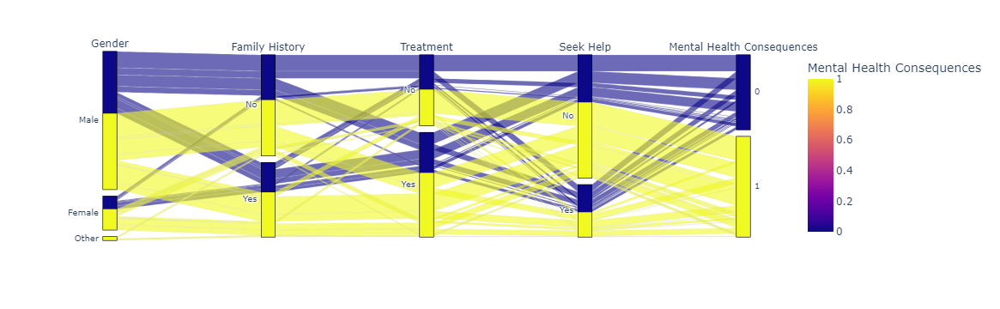

In [32]:
#Parallel Categories Graph 1
fig = px.parallel_categories(general , dimensions=['Gender', 'Family History', 'Treatment','Seek Help','Mental Health Consequences'],
                color="Mental Health Consequences",
                labels={'Gender':'Gender', 'Family History':'Family History', 'Treatment':'Treatment','Seek Help':'Seek Help',
                        'Mental Health Consequences':'Mental Health Consequences'})

fig.show()

Analyzing this Parallel Category Graph above we can infer the following:

Since this dataset focuses on categorical data such as Yes, No, Don't Know, we thought it was best to visualize it on a parallel graph. 

We can make inferences when we hover over any one of the section. When we hover toward the bottom we can see for example that there were in total 40 Males who responded 
- 'Yes' that they had 'Family History' of mental illness,  
- 'Yes' that they did 'treatment' 
- 'No' that they didnot 'seek help' from their employer 

As a result they still thought that discussing a mental health issue with the employer would have negative consequences

When we hover toward the top we can see for example that there were in total 37 Males who responded 
- 'Yes' that they had 'Family History' of mental illness,  
- 'Yes' that they did 'treatment' 
- 'Yes' that they didnot 'seek help' from their employer 

As a result they thought that discussing a mental health issue with the employer would not have a  negative consequences



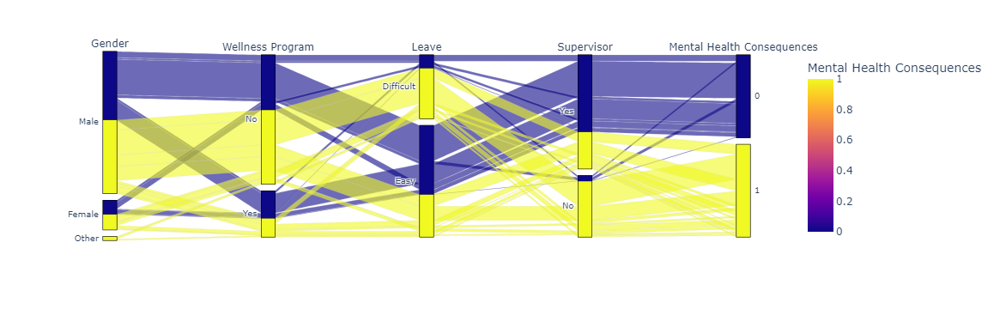

In [33]:
#Parallel Categories Graph 2
fig = px.parallel_categories(work,dimensions=['Gender', 'Wellness Program', 'Leave', 'Supervisor','Mental Health Consequences'],
                    color="Mental Health Consequences",
                    labels={'Gender':'Gender', 'Wellness Program':'Wellness Program', 'Leave':'Leave','Supervisor':'Supervisor',
                        'Mental Health Consequences':'Mental Health Consequences'})

fig.show()

When we hover toward the top we can see for example that there were in total 26 Males who responded 
- 'No' that they did not have 'Remote work'
- 'No' that their employer provide mental health benefits?
- 'No' that employer ever discussed mental health as part of an 'employee wellness program'?
- 'No' that their employer provide mental health benefits?
- 'Difficult' to get a medical leave 
- 'No' to discussing mental health issue with their direct supervisor

As a result they thought that discussing a mental health issue with the employer would have a  negative consequences

# Part 3

## **Question: What does the data reveal about a specific group (race, age, gender) suffering from mental illness?**
- Is depression higher in men or women?
- Which age group has more depression?

### **Evolution:**

- How do the depression levels change over the years across both, gender and age groups?
- Analyze/derive patterns if any across various continents by gender or age groups.

In [34]:
#Reading required sheets from the excel file of the dataset
data_by_age = pd.read_excel("Mental health Depression disorder Data.xlsx","prevalence-of-depression-by-age")
data_by_gender = pd.read_excel("Mental health Depression disorder Data.xlsx","prevalence-of-depression-males-")

#reading the Country-Continent mapping csv file
country_mapping = pd.read_csv('countryContinent.csv', encoding = "ISO-8859-1")
#selecting columns from csv for joining onto our dataset
country_mapping_v2 = country_mapping[["country", "continent","sub_region"]]

In [35]:
#renaming columns for both the datasets
data_by_age.rename(
    columns=({ 'Entity': 'Country','Code': 'Country_Code','20-24 years old (%)' : '20-24 years','10-14 years old (%)' : '10-14 years','All ages (%)' : 'All age groups','70+ years old (%)' : '70+ years','30-34 years old (%)' : '30-34 years','15-19 years old (%)' : '15-19 years','25-29 years old (%)' : '25-29 years','50-69 years old (%)' : '50-69 years','Age-standardized (%)' : 'Age_Standardized','15-49 years old (%)' : '15-49 years'}), 
    inplace=True,
)

data_by_gender.rename(
    columns=({ 'Entity': 'Country','Code': 'Country_Code','Prevalence in males (%)': 'Males','Prevalence in females (%)': 'Females','Population': 'Total_Population'}), 
    inplace=True,
)
#renaming columns for the mapping file
country_mapping_v2.rename(
    columns = ({'country':'Country','continent':'Continent','sub_region':'Sub_region'}),
    inplace = True,
)
#Performing a left join on the dataset ON COUNTRY to import its respective Continent and Sub-regions
data_by_gender = data_by_gender.merge(country_mapping_v2, on='Country', how='left')

In [36]:
#Pivoting up the dataset for a more usable/structured format

new_data = pd.melt(data_by_age, id_vars =['Country','Country_Code','Year'], value_vars =['20-24 years', '10-14 years',
                                                                    'All age groups','70+ years',
                                                                     '30-34 years','15-19 years',
                                                                     '25-29 years','50-69 years',
                                                                     'Age_Standardized','15-49 years'])

data_by_gender_v2 = pd.melt(data_by_gender, id_vars =['Continent','Sub_region','Country','Country_Code','Year','Total_Population'], value_vars =['Males','Females'])

#Renaming values for clearer understanding
data_by_gender_v2.rename(
    columns = ({'variable':'Gender','value':'Depression_percentage'}),
    inplace = True,
)

#Dropping all the NAN values to accuratley visualize the results
data_by_gender_v2 = data_by_gender_v2.dropna()

#Creating a new value for 100 times the value for increased variation in graphs
new_data['value_x100'] = new_data['value']*100

new_data.rename(
    columns = ({'variable':'Age_Group','value':'Percent_Value','value_x100':'Percent_Value_x100'}),
    inplace = True,
)
#Joining the database with the Country-Continent mapping
new_data = new_data.merge(country_mapping_v2, on='Country', how='left')
#data_by_gender_v2 = data_by_gender_v2.merge(country_mapping_v2, on='Country', how='left')

display(new_data)
display(data_by_gender_v2)

,Country,Country_Code,Year,Age_Group,Percent_Value,Percent_Value_x100,Continent,Sub_region
0,Afghanistan,AFG,1990,20-24 years,4.417802,441.780176,Asia,Southern Asia
1,Afghanistan,AFG,1991,20-24 years,4.433524,443.352425,Asia,Southern Asia
2,Afghanistan,AFG,1992,20-24 years,4.453689,445.368919,Asia,Southern Asia
3,Afghanistan,AFG,1993,20-24 years,4.464517,446.451666,Asia,Southern Asia
4,Afghanistan,AFG,1994,20-24 years,4.462960,446.295963,Asia,Southern Asia
...,...,...,...,...,...,...,...,...
64675,Zimbabwe,ZWE,2013,15-49 years,3.133858,313.385759,Africa,Eastern Africa
64676,Zimbabwe,ZWE,2014,15-49 years,3.153508,315.350781,Africa,Eastern Africa
64677,Zimbabwe,ZWE,2015,15-49 years,3.179233,317.923295,Africa,Eastern Africa
64678,Zimbabwe,ZWE,2016,15-49 years,3.206184,320.618417,Africa,Eastern Africa


,Continent,Sub_region,Country,Country_Code,Year,Total_Population,Gender,Depression_percentage
190,Asia,Southern Asia,Afghanistan,AFG,1990,12412000.0,Males,3.499982
191,Asia,Southern Asia,Afghanistan,AFG,1991,13299000.0,Males,3.503947
192,Asia,Southern Asia,Afghanistan,AFG,1992,14486000.0,Males,3.508912
193,Asia,Southern Asia,Afghanistan,AFG,1993,15817000.0,Males,3.513429
194,Asia,Southern Asia,Afghanistan,AFG,1994,17076000.0,Males,3.515578
...,...,...,...,...,...,...,...,...
95607,Africa,Eastern Africa,Zimbabwe,ZWE,2013,13350000.0,Females,3.424106
95608,Africa,Eastern Africa,Zimbabwe,ZWE,2014,13587000.0,Females,3.437674
95609,Africa,Eastern Africa,Zimbabwe,ZWE,2015,13815000.0,Females,3.455323
95610,Africa,Eastern Africa,Zimbabwe,ZWE,2016,14030000.0,Females,3.479071


***Analyzing Plots***

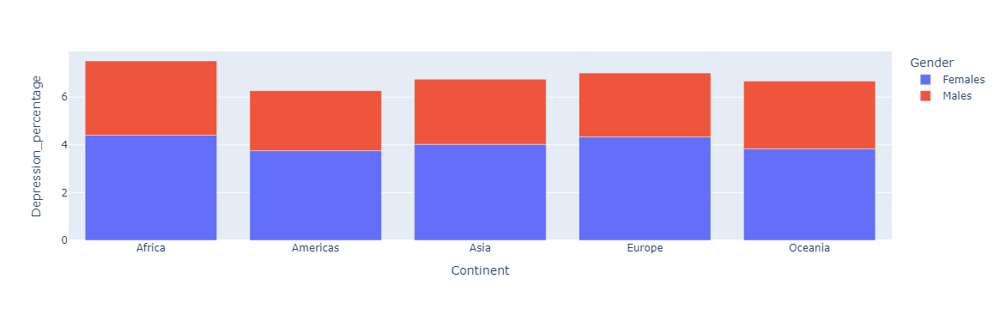

In [40]:
# Grouping the dataset by Continent and Gender to view the mean percentages of Depression 
data_plot1 = data_by_gender_v2.groupby(["Continent","Gender"],as_index=False)[['Depression_percentage']].mean()
plot1 = px.bar(data_plot1, x="Continent", y="Depression_percentage", color="Gender")
plot1.show()

From the graph plotted above we can see various 'Continets' across our x-axis and 'Depression Percentages' on y-axis. Our bargraph also stacked by Gender and when we hover over one of its section we can see the respective percentage of Depression in Males and Females. 

When we hover over each of the bargraph, we can see the coresponding depression percentage of both males(Red) and females(purple). We can conclude that in each of the contients the percentage of Depression is much more 'HIGHER' in Females than in Males.

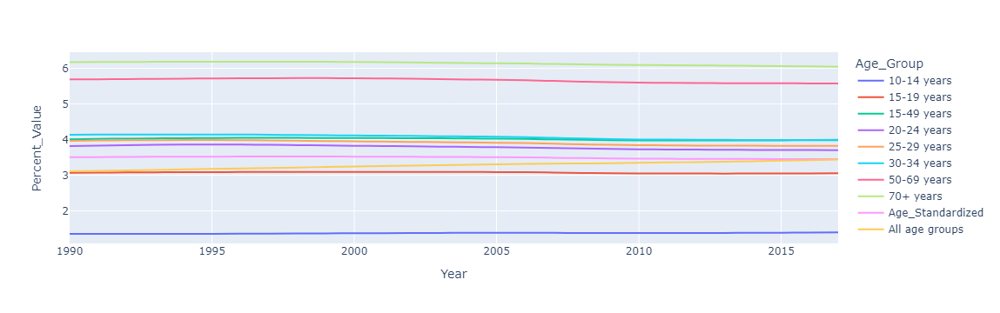

In [43]:
#Line Graph for different age groups
new_data_filtered_plot5 = new_data.groupby(["Year","Age_Group"],as_index=False)[['Percent_Value']].mean()

plot5 = px.line(new_data_filtered_plot5, x="Year", y="Percent_Value", color="Age_Group",line_shape="spline", render_mode="svg")
plot5.show()

After Plotting a line graph for all the different age groups we concluded that from year 1990 - 2016 there has not been a significant change in the percentages of Depression in each of the age groups. Although we can observe similar results to that of the preivous bar chart that overall there is a increase in depression percentage as one's age gets older


/tmp/ipykernel_294/2117343100.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,Country,Country_Code,Year,Age_Group,Percent_Value,Percent_Value_x100,Continent,Sub_region
0,Afghanistan,AFG,1990,20-24 years,4.417802,441.780176,Asia,Southern Asia
1,Afghanistan,AFG,1991,20-24 years,4.433524,443.352425,Asia,Southern Asia
2,Afghanistan,AFG,1992,20-24 years,4.453689,445.368919,Asia,Southern Asia
3,Afghanistan,AFG,1993,20-24 years,4.464517,446.451666,Asia,Southern Asia
4,Afghanistan,AFG,1994,20-24 years,4.462960,446.295963,Asia,Southern Asia
...,...,...,...,...,...,...,...,...
64675,Zimbabwe,ZWE,2013,15-49 years,3.133858,313.385759,Africa,Eastern Africa
64676,Zimbabwe,ZWE,2014,15-49 years,3.153508,315.350781,Africa,Eastern Africa
64677,Zimbabwe,ZWE,2015,15-49 years,3.179233,317.923295,Africa,Eastern Africa
64678,Zimbabwe,ZWE,2016,15-49 years,3.206184,320.618417,Africa,Eastern Africa


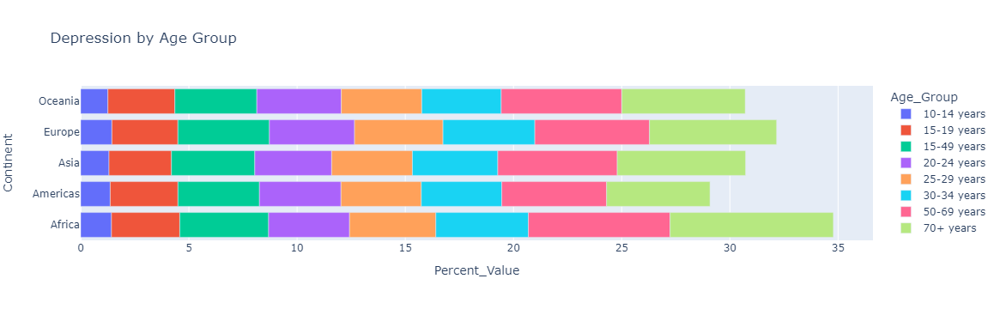

In [44]:
#Bar graph to visualize mean depression percentage
new_data_filtered = new_data[new_data.Age_Group != "All age groups"]
new_data_filtered = new_data_filtered[new_data.Age_Group != "Age_Standardized"]
display(new_data_filtered)

data_plot2 = new_data_filtered.groupby(["Continent","Age_Group"],as_index=False)[['Percent_Value']].mean()
plot2 = px.bar(data_plot2, x="Percent_Value", y="Continent", color="Age_Group",orientation = 'h', title="Depression by Age Group")
plot2.show()

From the Horizontal Bar graph plotted above we can see various 'Mean Depression Percentage' across our x-axis and 'Continents' on y-axis from year 1990-2016 . Our bargraph is stacked by different age groups and when we hover over one of its section we can see the respective percentage of Depression across different age groups. 

Overall there is a increase in depression percentage as one's age gets older
For example after hovering over each of the age groups in the continents we can conclude that the following: 

- Percentage of Depression is lowest (1%) in the age groups (10-14)
- Percentage of Depression increases slightly to (3%) in the age groups (15-19)
- Percentage of Depression increases slightly to (4%) and remains steady  in the age groups (20-24 ; 25-29 ; 25-29 ; 30-34)
- Percentage of Depression increases slightly to (5.5%) and remains steady  in the age groups above 50

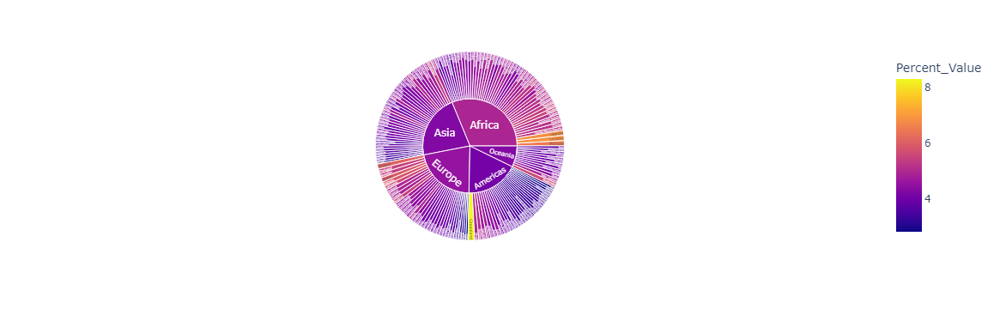

In [41]:
#Sunburst Graph
new_data_v2 = new_data.dropna()
plot3 = px.sunburst(new_data_v2, path=['Continent', 'Country'], values='Percent_Value_x100',
                  color='Percent_Value', hover_data=['Country_Code'])
plot3.show()

Our team decided to use the above SunBurst Graph to compare our previous tree map results and look at the rankings of Continents by mean percentages of Depression and our results are the following:

1. Africa
2. Asia
3. Europe

We can also interact with the graph and by clicking on anyone of the continents, which will show us different countries in that continet. Aditionally, we can hover over any country or continent to view its corresponding Mean Depression percentages. Provided on the right is a colorscale (Dark to Light) that we can use to analyze how intense are the Depression percentage in those countries/continents

After comparing our results from the Sunburst Map we can confirm that our rankings and intensities are similar to that  of our previous Tree Map. 

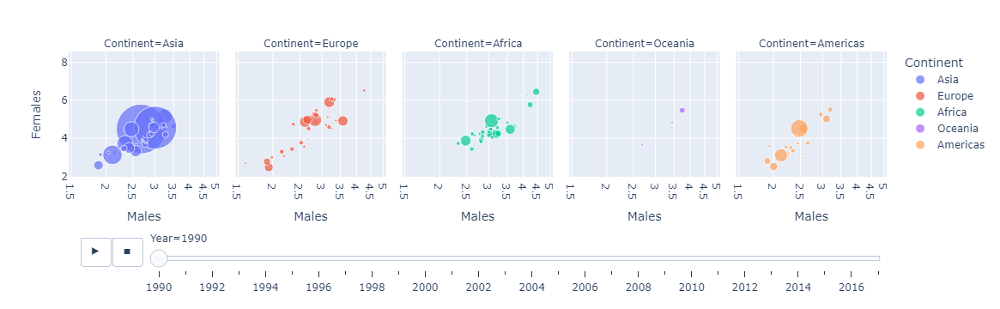

In [45]:
#Scatter graph to visualize male vs females per continent
plot4 = px.scatter(data_by_gender.dropna(), x="Males", y="Females", animation_frame="Year", animation_group="Country",
           size="Total_Population", color="Continent", hover_name="Country", facet_col="Continent",
           log_x=True, size_max=45)
plot4.show()

Analyzing this Scatter Plot we can infer the following:

On this graph we are comparing Males(x-axis) and Females(y-axis) across all the countries (grouped by continents) between 1990-2016 and see how they relate to one another. The graph is interactive and we can look at the trends throught the year by clicking the play button on the timeline.

Looking at trends for across all continents:
We can observe that as the number of percentage of males depressed goes up so does the depression in female goes up. But, over the years (after animating through the timeline) there is no movement of the bubbles on the graph which shows no significant change in percentage throughtout the years.  

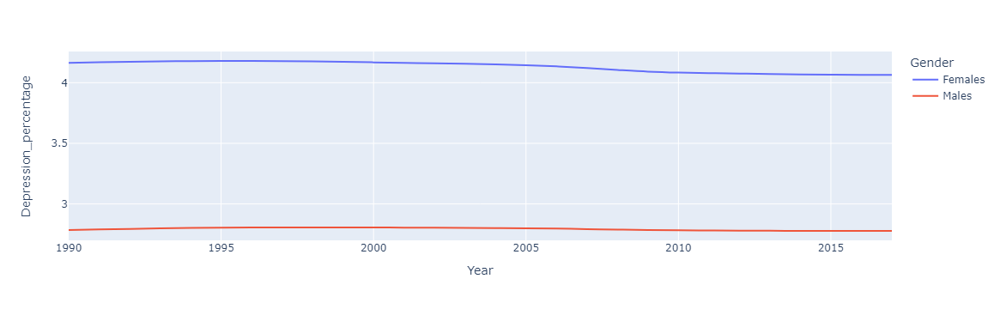

In [46]:
#Line graph to visualize Depression pecentages by Gender
data_by_gender_v2_plot6 = data_by_gender_v2.groupby(["Year","Gender"],as_index=False)[['Depression_percentage']].mean()

plot6 = px.line(data_by_gender_v2_plot6, x="Year", y="Depression_percentage", color="Gender",line_shape="spline", render_mode="svg")
plot6.show()

After Plotting a line graph for Males and Females from year 1990 - 2016, we observe there has not been a significant change in the percentages of Depression in the Gender group. We can conclude that across all the contients the percentage of Depression is much more 'HIGHER' in Females (approx. 4.2) than in Males (approx 2.8).

## Summary of Findings

#### Revisiting Guiding Questions
1. How does each country rank with its population suffering from a specific mental illness?

    - With plethora of visulizations inclduing Tree Maps, Bar charts and Geographical Maps we concluded that the Top 3
      Continets with highest Mean Depression Percentage between 1990-2020 are Africa, Asia and Europe repectively. As       a team we also added a interactive way to look at each country with its ranking of each of the mental disorder. 
      In addition a cartograohic map was created to allow one to visualize mean percentages of various Illness across 
      the world between in 1990-2016 with the help of a colormap.
      
      Furthermore discovered by plotting the mean of different Illness on a area graph, that the top 2 mental Illness 
      affecting the world are Anxiety and Depression. 
     
2. What kind of relationship patterns do we see between the disorders? 

    - After discovering that the top 2 mental Illness affecting the world are Anxiety and Depression, We wanted to 
      hypothize to see if there is a relationship between Subtance use (Alcohol, Drug ) and Prevalnce of Mental
      Illness. In order to see if ther is a correlation we plotted two scatter plot to see what kind of relatioship 
      exisited. To our surprise we found out that there was a strong positive correlation between Drug use and Anxiety 
      disorders across all continets over the period 1990-2016 
             
3. What is the general trend of education level based on the three main educational levels?

    - Dataset we used to answer this question was limited for following reasons: It included only select european
      countries, the size of the data collected was very small, data was only collected for year 2014. Even with these       limitiations we were able to conlude that   With the help of bar chart we were able to conclude that People in         the 'Below Upper Secondary' category, which includes those who have not completed high school, have the highest       levels of depression.
    
4. General insights into how depression percentages compared between people actively looking for jobs vs job searchers?
 
5. How do the depression levels change over the years across both, gender and age groups?

6. Analyze/derive patterns if any across various continents by gender or age groups.



## Refrences

Elyse, P.by: (2020) 10 happiest countries in the world 2014, Miratel Solutions Inc. Gallup-Healthways Global Well-Being Index. Available at: https://miratelinc.com/blog/10-happiest-countries-in-the-world-2014/ (Accessed: October 13, 2022). 

GBD results. Institute for Health Metrics and Evaluation. Available at: https://vizhub.healthdata.org/gbd-results/ [Accessed September 29, 2022]. 

OECD Education at a Glance , OECD statistics. Available at: https://stats.oecd.org/Index.aspx?datasetcode=EAG (Accessed: October 4, 2022). 

International Classification of Diseases (ICD) (no date) World Health Organization. World Health Organization. Available at: https://www.who.int/classifications/classification-of-diseases (Accessed: October 4, 2022).

Open Sourcing Mental Illness, L.T.D. (2016) Mental Health in Tech Survey, Kaggle. OSMH. Available at: https://www.kaggle.com/datasets/osmi/mental-health-in-tech-survey (Accessed: October 15, 2022). 
